# Exploratory Spatial Data Analysis of Tweets



## Load dataset and libraries

In [1]:
%matplotlib inline

In [2]:
from preprocessing import *
import gensim
from nltk.stem.porter import *
import nltk
from nltk.corpus import stopwords
from gensim import corpora
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
import folium
import pyLDAvis.gensim
import statistics
import warnings
from folium.plugins import MarkerCluster
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))
warnings.filterwarnings("ignore", category=DeprecationWarning) 
text_column = 'text'
date_column = 'date'
pd.set_option('display.max_colwidth', -1)

In [3]:
df = pd.read_csv('../tweets/drc_tweets_ebola_covid.csv', sep=',', error_bad_lines=False, index_col=False, warn_bad_lines=False)
#df = pd.read_csv('drc_tweets_ebola_covid.csv', sep=',', error_bad_lines=False, index_col=False, warn_bad_lines=False)
df = df[['date','text','latitude','longitude','drc_province_id','covid','ebola','photo_url']]
df.head(10)

,date,text,latitude,longitude,drc_province_id,covid,ebola,photo_url
0,2014-12-03 09:16:21,"Airport #Goma Mme votre carnet de vaccination n a pas des cachets des vaccins:"" typhoide et meningite"" c est 15 $ par cachet @RosineDusabe",-4.324071,15.336639,24.0,f,f,NaN
1,2012-11-08 16:11:54,Photo http://t.co/TzWDWNfv,-4.271590,15.282910,NaN,f,f,NaN
2,2013-10-08 19:50:47,@kristakivuvu1 bien g veux essaie,-4.336810,15.313160,24.0,f,f,NaN
3,2014-07-12 10:36:04,#Chilling with my bro uriel.,-4.439525,15.257977,24.0,f,f,NaN
4,2014-11-05 22:42:47,I just be chilling.,-4.409221,15.281549,24.0,f,f,NaN
5,2012-11-10 04:31:06,J'irai talheur,-4.279754,15.264857,NaN,f,f,NaN
6,2019-01-23 14:10:41,"UTILIDADE PÚBLICA Alerta recebido de fonte da PF sobre notas falsas. Estão circulando muitas notas falsas . São notas quase perfeitas, muitas vezes passando até pelo teste da caneta,… https://t.co/688vaN2Ibe",-4.310358,15.291574,24.0,f,f,NaN
7,2017-06-18 17:23:20,Chill out @newkwilubar Guest: DJ MEJi THE fire man #Now @ New KWILU BAR https://t.co/qWpckvmDuW,-4.305991,15.293863,24.0,f,f,NaN
8,2014-11-01 14:48:30, la grippe vraiment eza kindoki,-4.347167,15.283541,24.0,f,f,NaN
9,2012-12-12 20:02:13,"Who gets a cold in 10000 degree weather, thiis girl",-4.319832,15.330422,24.0,f,f,NaN


In [4]:
df_ebola = df[df['ebola'] == 't']
df_covid = df[df['covid'] == 't']

In [5]:
df.shape

(436018, 8)

In [6]:
df_ebola.head(10)

,date,text,latitude,longitude,drc_province_id,covid,ebola,photo_url
22,2012-11-13 06:39:27,Vien de se réveille !!! #fatiguer,-4.271630,15.283240,NaN,f,t,NaN
63,2014-04-20 13:52:10,La méchanceté c'est la faiblesse des imbéciles qui se croient forts,-4.337040,15.219776,24.0,f,t,
64,2014-10-12 16:10:53,"""@PatrickMuyaya: L'intelligence est le premier point faible des hommes intelligents !!!""&lt;~ Smartness is the 1st weakness of smart people.",-4.393446,15.267474,24.0,f,t,NaN
73,2015-06-29 06:44:43,Nos faiblesses remplacées par la puissance du Saint-Esprit. #LostInYouGod#,-4.355790,15.260455,24.0,f,t,NaN
74,2014-04-03 20:51:44,“@rickyrozay: Get'n $ break weak hoes in the proce$$. #Gabos http://t.co/6aXrjDXnCe” t'as perdu du poids un peu toi 😏😏 mdr,-4.366191,15.259955,24.0,f,t,NaN
75,2013-07-04 23:21:26,Weak of woman. '' Their big mouth '',-4.346420,15.257390,24.0,f,t,NaN
76,2013-04-03 22:21:10,L'ignorance est une faiblesse :(,-4.344690,15.254400,24.0,f,t,NaN
77,2015-04-25 15:16:22,Ta force cest ma faiblesse.,-4.363353,15.245396,24.0,f,t,NaN
78,2014-12-14 14:21:16,"@Joaobap57934294 @MamyKanku Avec votre régime, la #Rdc risque de sortir de ce cycle avec les mêmes faiblesses du départ.Réfléchissons un peu",-4.351418,15.251797,24.0,f,t,
85,2014-10-14 21:06:48,"@blaisengo @donbish5 In terms of discipline army, Hitler built one strong &amp; loyal to him. That's where jk failed, &amp; that's his weakness 1/2",-4.344873,15.256831,24.0,f,t,NaN


In [7]:
df_covid.head(10)

,date,text,latitude,longitude,drc_province_id,covid,ebola,photo_url
434471,2021-02-02 14:01:02,Seat sale at @AmericanAir. Guess who's going to Malawi and possibly getting Covid? This guy! #dipstick,2.000000,18.000000,NaN,t,f,NaN
434472,2020-07-28 16:16:24,"Friday is World Ranger Day, but as this is a particularly difficult year for conservation efforts in Africa - the COVID-19 pandemic having cut off much of the available funding as well as making an already tough… https://t.co/pwmZXNhTP1",3.757441,29.528047,1.0,t,f,NaN
434473,2020-04-18 07:22:45,"Madere wa FUSO corona Konki alijua atapenya hapo kwenye Nzito akijua ni kama ile michezo yao ya kuchora machata kwenye Cabin ka ubao wa shule 😀😀😀 @ Katanga, Democratic Republic Congo https://t.co/30k04ZOgPM",-10.304100,27.388900,9.0,t,f,NaN
434474,2020-05-11 06:40:34,On aura tout vu avec ce port obligatoire des masques.\n\nIci c'est à Kiliba avec le grand sensibilisateur sur le COVID-19 Mr. JC. à Kiliba https://t.co/zL2tsEfGLw,-3.241980,29.230250,20.0,t,f,NaN
434475,2020-03-21 15:12:42,"STOP COVID-19\nCe message vidéo émane de l'@ucbukavu, @hpgrb, @SFCG_\net Bak Event. Aidez-nous à le diffuser afin de… https://t.co/N47s8C3Ujy",-2.494133,28.866015,20.0,t,f,NaN
434476,2020-04-26 06:41:52,"Enjoy the rest of your week ahead.....\nRemember to exercise, to boost your immunity against COVID_19 and other ailments... https://t.co/wP3ZaZc4Fx",-2.494133,28.866015,20.0,t,f,http://pbs.twimg.com/media/EWgq169X0AAgm8L.jpg
434477,2020-06-07 15:17:42,Nous ne savons plus le but de notre lutte contre la Covid-19 si c'est pour nous entretuer ou bien ! Cet adolescent… https://t.co/zAR2VmCd6S,-2.494133,28.866015,20.0,t,f,NaN
434478,2020-04-20 02:05:42,"#Africa #African #vibes #mood #sundayvibes #weekendvibes #quarantinelife #covid @ Kinshasa, Congo https://t.co/1x98iax98i",-4.313540,15.309400,24.0,t,f,NaN
434479,2020-03-23 15:48:22,Le corona virus 🦠 est réel peuple congolais 🇨🇩🤦🏾‍♂️,-4.312391,15.273200,24.0,t,f,NaN
434480,2020-05-28 22:14:26,La maladie à COVID-19 tue\n\nRespectez les mesures préventives\n\nEt lorsque vous n'avez rien d'important ou d'urgent à faire dehors\nSVP\n\nRESTEZ CHEZ VOUS !!! à À Kinshasa https://t.co/t2cs2kjiT0,-4.378526,15.262231,24.0,t,f,NaN


## Natural language processing

In [8]:
def createWordcloud(text):
    wordcloud = WordCloud(background_color='white').generate(' '.join(text))
    plt.figure(figsize=(20, 20))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

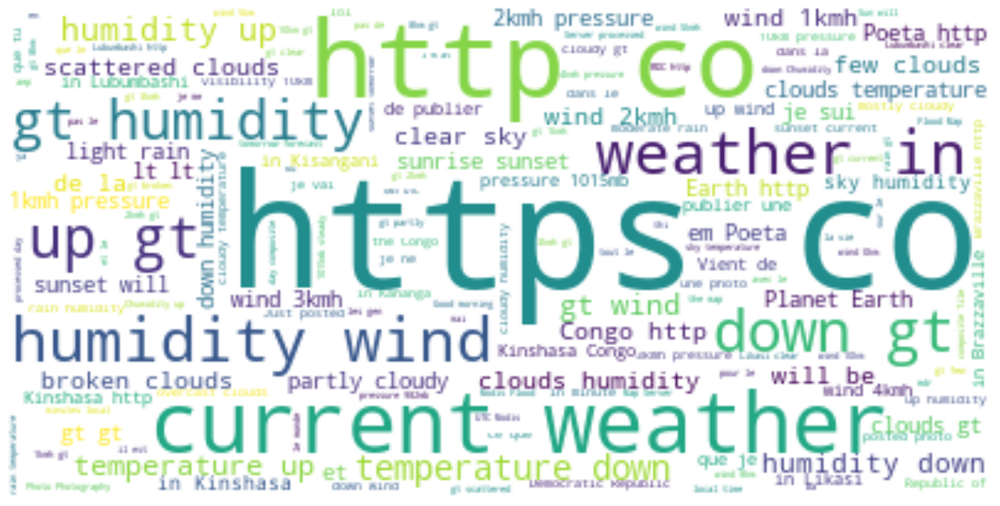

In [9]:
createWordcloud(df[text_column])

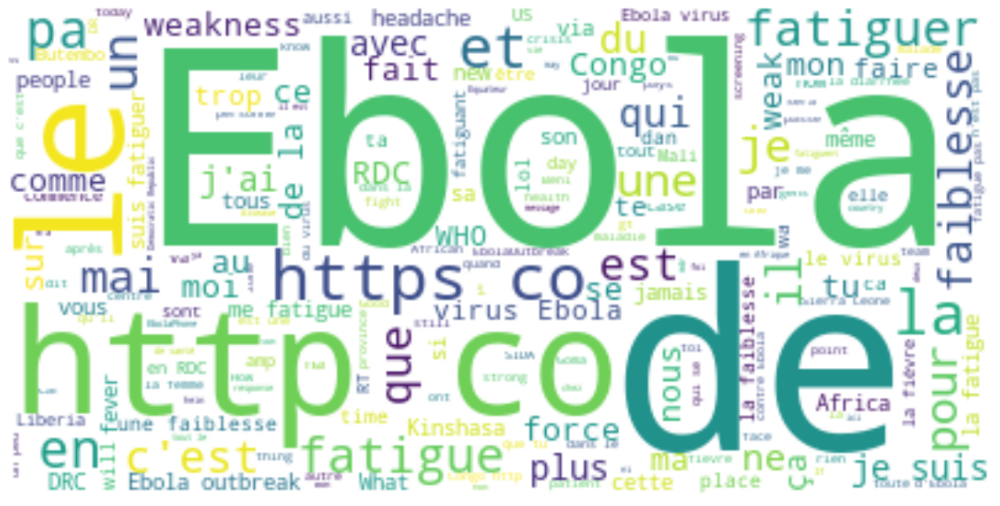

In [10]:
createWordcloud(df_ebola[text_column])

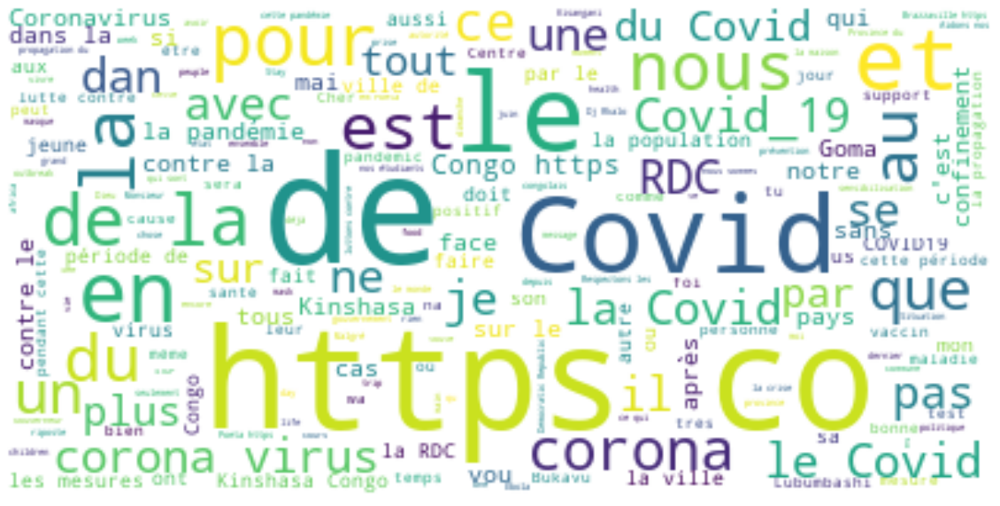

In [11]:
createWordcloud(df_covid[text_column])

## Wordclouds preprocessed Tweets

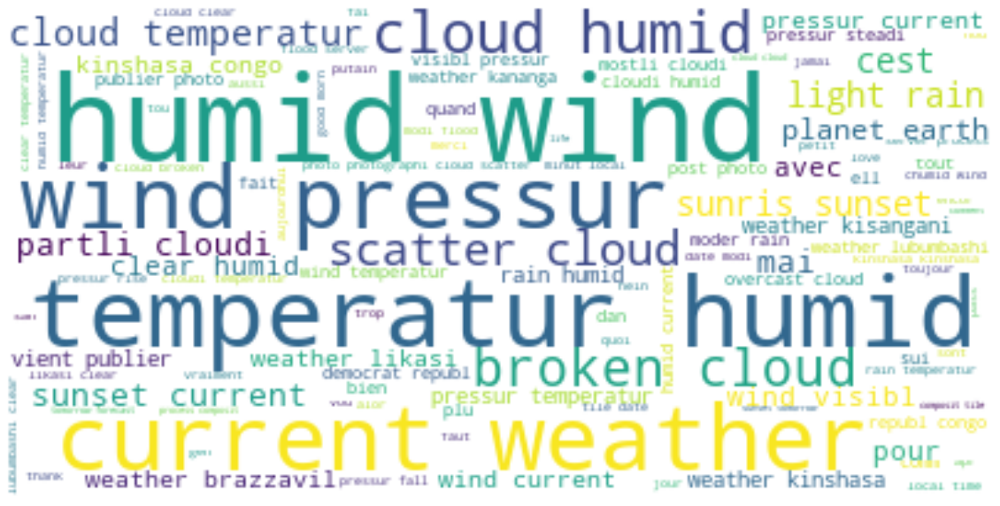

In [12]:
createWordcloud(preprocessTweetText(df[text_column]))

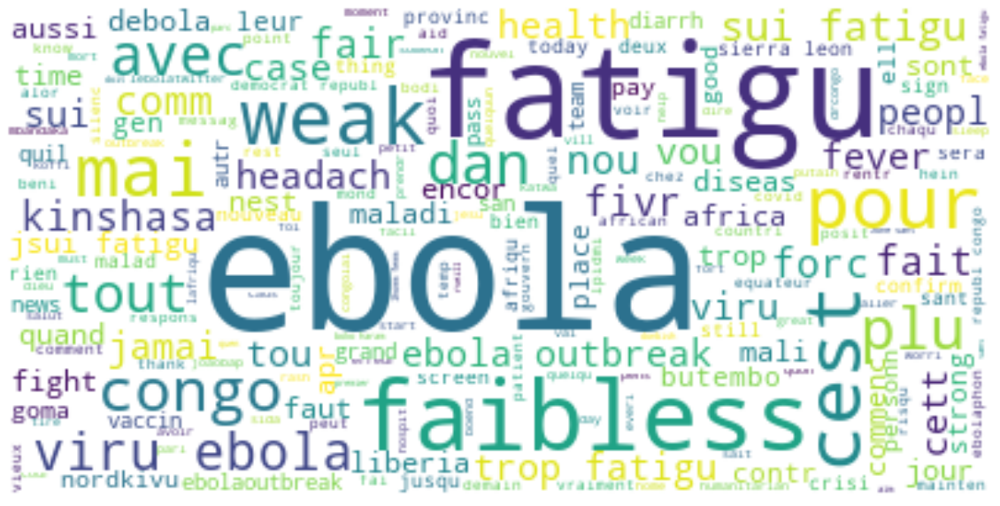

In [13]:
createWordcloud(preprocessTweetText(df_ebola[text_column]))

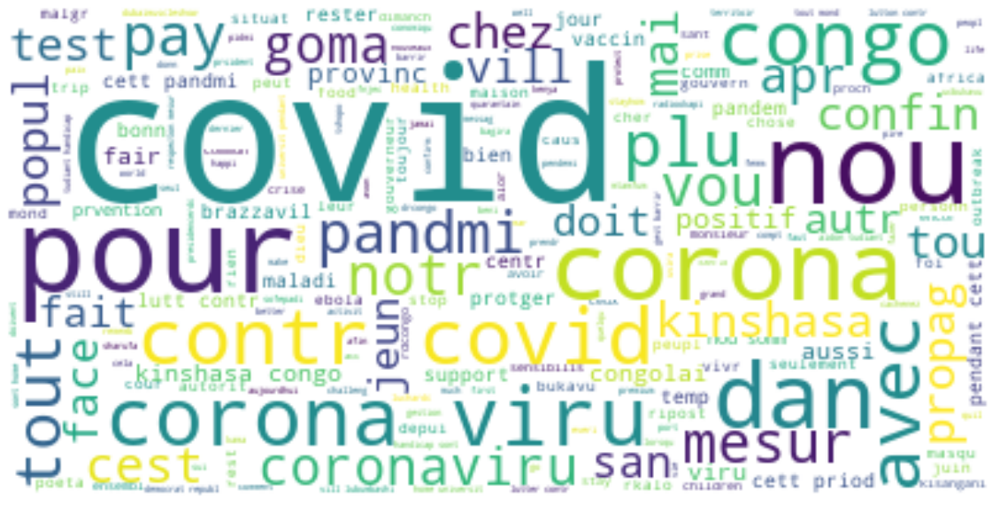

In [14]:
createWordcloud(preprocessTweetText(df_covid[text_column]))

Download nltk Ressources.

In [15]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\b1022699\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\b1022699\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### Transform tweets text into usable format

In [16]:
#tweets' text as list
tweets_text = df[text_column].tolist()
#lowercase
tweets_text=[tweet.lower() for tweet in tweets_text]

#remove URLs
remove_url_regex = r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b'
tweets_text = filter_tweets_before_tokenization(tweets_text, remove_url_regex)

#tokenization
tweets_text=[nltk.word_tokenize(tweet) for tweet in tweets_text]

### Text preprocessing

Test multiple preprocessing procedures and observe their impact on the analysis results

In [17]:
#remove special characters
remove_sc_regex = r'[^A-Za-z ]+'
tweets_text = filter_tweets_after_tokenization(tweets_text, remove_sc_regex)

# remove short words
remove_short_words_regex = r'\W*\b\w{1,3}\b'
tweets_text = filter_tweets_after_tokenization(tweets_text, remove_short_words_regex)

# Remove all user names in the tweet text
user_names_regex = r"@\S+"
tweets_text = filter_tweets_after_tokenization(tweets_text,user_names_regex)

#increase keyword frequency by aggregating similar keywords
# check the order if preprocessing routine! e.g. stemming would effect the performance of synonym handling
#disaster = 'hurrican'
#disaster_terms = ['hurricane', 'hurricaneharvey', 'hurricane_harvey', 'flood', 'storm']
#tweets_text = synonym_handling(tweets_text, disaster, disaster_terms)

#Remove unique words that appear only once in the dataset
frequency = getFrequency(tweets_text)
min_frequency_words = 2
tweets_text = [[token for token in tweet if frequency[token] > min_frequency_words] for tweet in tweets_text]

# Remove stop words
# You need to download the stopwords
from nltk.corpus import PlaintextCorpusReader
stoplist = set(stopwords.words('english'))
tweets_text = [[word for word in document if word not in stoplist] for document in tweets_text]

#Stemming
stemmer = PorterStemmer()
#stemmer = SnowballStemmer("english")
tweets_text = [[stemmer.stem(word) for word in sub_list] for sub_list in tweets_text]

#remove empty strings
tweets_text = [[word for word in document if word] for document in tweets_text]

tweets_text[:10]

[['airport', 'goma', 'votr', 'carnet', 'vaccin', 'vaccin', 'rosinedusab'],
 ['photo'],
 ['kristakivuvu', 'bien', 'veux', 'essai'],
 ['chill'],
 ['chill'],
 ['jirai', 'talheur'],
 ['utilidad',
  'pblica',
  'alerta',
  'recebido',
  'font',
  'sobr',
  'nota',
  'falsa',
  'esto',
  'muita',
  'nota',
  'falsa',
  'nota',
  'quas',
  'muita',
  'veze',
  'passando',
  'pelo',
  'test',
  'caneta'],
 ['chill', 'newkwilubar', 'guest', 'meji', 'fire', 'kwilu'],
 ['gripp', 'vraiment', 'kindoki'],
 ['get', 'cold', 'degre', 'weather', 'girl']]

Create corpus and dictionary for LDA

In [18]:
dict = gensim.corpora.Dictionary(tweets_text)
corpus = [dict.doc2bow(text) for text in tweets_text]

Train Model

In [19]:
num_topics= 4
alpha = 0.0001
eta= 0.0001
passes = 10
lda = gensim.models.LdaMulticore(corpus, id2word=dict, num_topics= num_topics, alpha = alpha, eta= eta, passes = passes)

C:\ProgramData\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:824: RuntimeWarning: overflow encountered in exp2
  perwordbound, np.exp2(-perwordbound), len(chunk), corpus_words


Show top words of topics

In [20]:
top_words = 10

#show top words of topics
for t in range(lda.num_topics):
    print('topic {}: '.format(t+1) + ', '.join([v[0] for v in lda.show_topic(t, top_words)]))

#show top words of topics with probabilities  
#for t in range(lda.num_topics):
#   print('topic {}: '.format(t+1) + ', '.join([v[0] + " (" + str(v[1]) + ")" for v in lda.show_topic(t, top_words)]))


topic 1: humid, wind, temperatur, cloud, pressur, weather, current, sunset, kinshasa, clear
topic 2: love, congo, like, peopl, happi, adida, republ, follow, democrat, life
topic 3: cest, pour, mai, dan, vou, tout, plu, avec, ell, fait
topic 4: kinshasa, congo, photo, vient, publier, planet, earth, post, lubumbashi, vill


### Visualise topics and check relation between them
If the window is not big enough, you can enlarge it with Cell -> Current Outputs -> Toggle Scrolling 

In [21]:
import pyLDAvis.gensim
vis = pyLDAvis.gensim.prepare(lda, corpus, dict, sort_topics=False)
print(vis.topic_order)
pyLDAvis.display(vis)

[1, 2, 3, 4]


C:\ProgramData\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


## Check time-series

In [24]:
df[date_column] = pd.to_datetime(df[date_column])

In [25]:
print(min(df[date_column]))
print(max(df[date_column]))

2012-01-09 18:55:56
2021-05-16 21:39:29


Text(0.5, 1.0, 'Time-series Covid-Tweets DRC Congo')

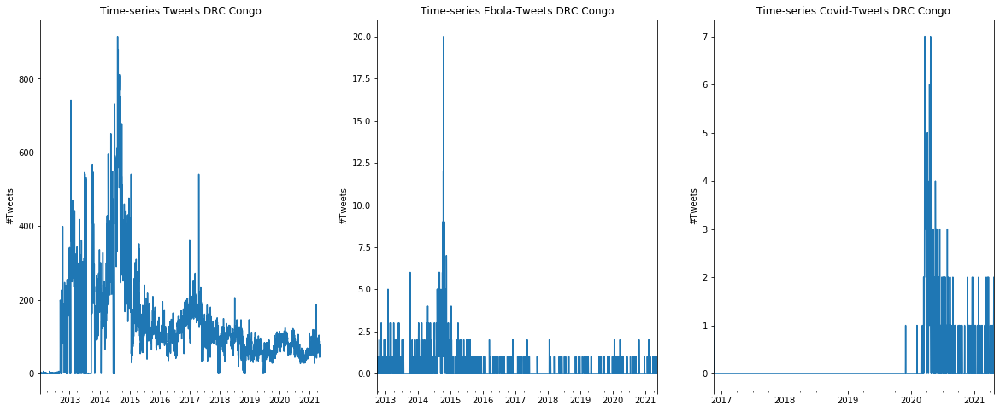

In [26]:
figure, axes = plt.subplots(1, 3,figsize=(20,8))

df_sum = df[date_column].value_counts().resample('D').sum()
ax = df_sum.plot(label='Number of Tweets',ax=axes[0])
axes[0].set_ylabel("#Tweets")
axes[0].set_title("Time-series Tweets DRC Congo")

df_sum = df_ebola[date_column].value_counts()
df_sum.index = pd.to_datetime(df_sum.index)
df_sum = df_sum.resample('D').sum()
ax = df_sum.plot(label='Number of Tweets',ax=axes[1])
axes[1].set_ylabel("#Tweets")
axes[1].set_title("Time-series Ebola-Tweets DRC Congo")

df_sum = df_covid[date_column].value_counts()
df_sum.index = pd.to_datetime(df_sum.index)
df_sum = df_sum.resample('D').sum()
ax = df_sum.plot(label='Number of Tweets',ax=axes[2])
axes[2].set_ylabel("#Tweets")
axes[2].set_title("Time-series Covid-Tweets DRC Congo")

## Relative frequency

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Text(0.5, 1.0, 'Time-series Covid-Tweets DRC Congo')

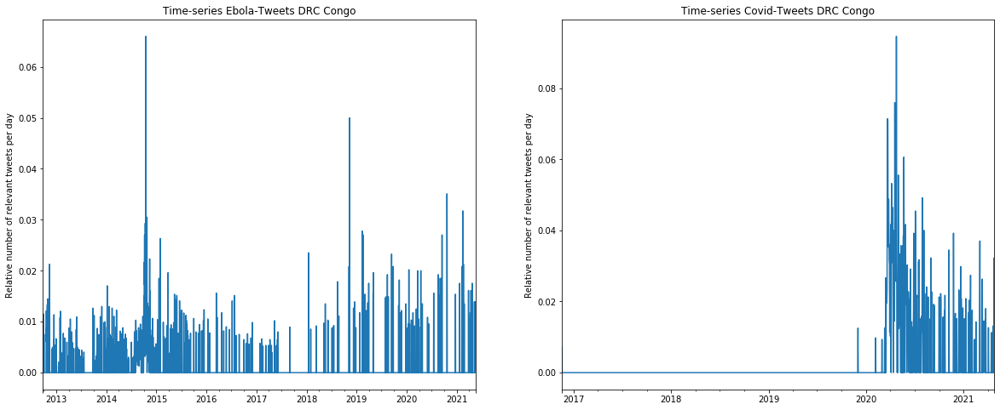

In [27]:
figure, axes = plt.subplots(1, 2,figsize=(20,8))
df_sum_all = df[date_column].value_counts().resample('D').sum()
df_sum = df_ebola[date_column].value_counts()
df_sum.index = pd.to_datetime(df_sum.index)
df_sum = df_sum.resample('D').sum()

df_concatenated = pd.concat([df_sum_all, df_sum], axis=1)
df_concatenated.columns = ['df_sum_all','df_sum']
df_concatenated = df_concatenated[df_concatenated['df_sum'].notnull()]
df_concatenated['ratio'] = df_concatenated['df_sum']/df_concatenated['df_sum_all']
df_concatenated['ratio'][df_concatenated['ratio'].isna()] = 0

ax = df_concatenated['ratio'].plot(label='Number of Tweets',ax=axes[0])
axes[0].set_ylabel("Relative number of relevant tweets per day")
axes[0].set_title("Time-series Ebola-Tweets DRC Congo")

df_sum = df_covid[date_column].value_counts()
df_sum.index = pd.to_datetime(df_sum.index)
df_sum = df_sum.resample('D').sum()

df_concatenated = pd.concat([df_sum_all, df_sum], axis=1)
df_concatenated.columns = ['df_sum_all','df_sum']
df_concatenated = df_concatenated[df_concatenated['df_sum'].notnull()]
df_concatenated['ratio'] = df_concatenated['df_sum']/df_concatenated['df_sum_all']
df_concatenated['ratio'][df_concatenated['ratio'].isna()] = 0

ax = df_concatenated['ratio'].plot(label='Number of Tweets',ax=axes[1])
axes[1].set_ylabel("Relative number of relevant tweets per day")
axes[1].set_title("Time-series Covid-Tweets DRC Congo")

## Check geospatial distribution

In [28]:
#-3.5015095035797277, 23.609359609011225
def generateBaseMap(default_location=[-3.5015095035797277, 23.609359609011225], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [29]:
y = statistics.mean(df['latitude']) 
x = statistics.mean(df['longitude']) 

In [31]:
dataframes = [df,df_ebola,df_covid]
base_maps = []
for df in dataframes:
    df['count'] = 1
    base_map = generateBaseMap([y,x],4)
    data = df[['latitude', 'longitude', 'count']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist()
    HeatMap(data=data, radius=8, max_zoom=13).add_to(base_map)
    base_maps.append(base_map)

htmlmap = HTML('<iframe srcdoc="{}" style="float:left; width: {}px; height: {}px; display:inline-block; width: 33%; margin: 0 auto; border: 2px solid black"></iframe>'
           '<iframe srcdoc="{}" style="float:right; width: {}px; height: {}px; display:inline-block; width: 33%; margin: 0 auto; border: 2px solid black"></iframe>'
               '<iframe srcdoc="{}" style="float:right; width: {}px; height: {}px; display:inline-block; width: 33%; margin: 0 auto; border: 2px solid black"></iframe>'
           .format(base_maps[0].get_root().render().replace('"', '&quot;'),500,500,
                   base_maps[1].get_root().render().replace('"', '&quot;'),500,500,
              base_maps[2].get_root().render().replace('"', '&quot;'),500,500))
display(htmlmap)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\display.py:694: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## Interactive Maps

In [32]:
from folium.plugins import MarkerCluster
df_ebola['photo_url'] = df_ebola['photo_url'].apply(lambda x: ' '.join([ "<img src=\""+ elem + "\" width=\"200\">" for elem in x.split(',')]) if pd.notnull(x) and x != ' ' else None)
map = folium.Map(location=[y, x], zoom_start=6)
marker_cluster = MarkerCluster().add_to(map)
for index, row in df_ebola.iterrows():
    text = str(row['date']) + " " +  row['text']
    text = text.encode('ascii', 'xmlcharrefreplace').decode("utf-8").replace("'", " ").replace("`", " ")
    text = ' ' +  text + ' <br>'
    if pd.notnull(row['photo_url']):
        text = text + " " + str(row['photo_url']) + " <br>"
    folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=text, parse_html=True,
            tooltip = "Click for more"
        ).add_to(marker_cluster) 
map

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [33]:
from folium.plugins import MarkerCluster
df_covid['photo_url'] = df_covid['photo_url'].apply(lambda x: ' '.join([ "<img src=\""+ elem + "\" width=\"200\">" for elem in x.split(',')]) if pd.notnull(x) and x != ' ' else None)
map = folium.Map(location=[y, x], zoom_start=6)
marker_cluster = MarkerCluster().add_to(map)
for index, row in df_covid.iterrows():
    text = str(row['date']) + " " +  row['text']
    text = text.encode('ascii', 'xmlcharrefreplace').decode("utf-8").replace("'", " ").replace("`", " ")
    text = ' ' +  text + ' <br>'
    if pd.notnull(row['photo_url']):
        text = text + " " + str(row['photo_url']) + " <br>"
    folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=text, parse_html=True,
            tooltip = "Click for more"
        ).add_to(marker_cluster) 
map

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
